In [1]:
from openslide import open_slide
import os
import numpy as np
import matplotlib.pyplot as plt
import cv2
from PIL import Image, ImageDraw
from glob import glob
from tqdm import tqdm

In [2]:
SOURCE_DIR = os.path.expanduser('~/Projects/Columbia/Applied_DL/CamelyonProject/data/source_data')
DEST_DIR = os.path.expanduser('~/Projects/Columbia/Applied_DL/CamelyonProject/data/bounding_boxes')

In [3]:
slide_img_paths = [f for f in glob(SOURCE_DIR + '/tumor*.tif') if 'mask.tif' not in f]

In [4]:
# slide = open_slide(os.path.join(TEST_LOCAL_DIR, slide_filename))

In [5]:
# See https://openslide.org/api/python/#openslide.OpenSlide.read_region
# Note: x,y coords are with respect to level 0.
# There is an example below of working with coordinates
# with respect to a higher zoom level.

# Read a region from the slide
# Return a numpy RBG array
# def read_slide(slide, x, y, level, width, height, as_float=False):
#     im = slide.read_region((x,y), level, (width, height))
#     im = im.convert('RGB') # drop the alpha channel
#     if as_float:
#         im = np.asarray(im, dtype=np.float32)
#     else:
#         im = np.asarray(im)
#     assert im.shape == (height, width, 3)
#     return im

def read_slide_pil(slide, x, y, level, width, height, as_float=False):
    im = slide.read_region((x,y), level, (width, height))
    im = im.convert('RGB') # drop the alpha channel
    return im

In [6]:
def get_normal_image_contours(cont_img, rgb_image, cont_img_tmp):
    contours, _ = cv2.findContours(cont_img, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours_tmp, _ = cv2.findContours(cont_img_tmp, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # print(contours)
    boundingBoxes = [cv2.boundingRect(c) for c in contours]
    # print(boundingBoxes)
    contours_rgb_image_array = np.array(rgb_image)
    contours_rgb_image_array_tmp = np.array(rgb_image)

    line_color = (255, 0, 0)  # blue color code
    cv2.drawContours(contours_rgb_image_array, contours, -1, line_color, 3)
    cv2.drawContours(contours_rgb_image_array_tmp, contours_tmp, -1, line_color, 3)
    # cv2.drawContours(mask_image, contours_mask, -1, line_color, 3)
    return contours_rgb_image_array, boundingBoxes, contours_rgb_image_array_tmp

In [7]:
def draw_bbox(slide_pil_img, bounding_boxes):
    draw = ImageDraw.Draw(slide_pil_img)
    for i, bounding_box in enumerate(bounding_boxes):
        x = int(bounding_box[0])
        y = int(bounding_box[1])
        thickness = 5
        for offset in range(thickness):
            draw.rectangle([x + offset, y + offset, x + offset + bounding_box[2], y + offset + bounding_box[3]],
                           outline=(255, 0, 0))

In [12]:
def get_slide_with_bouding_box(slide):
    slide_pil_image = read_slide_pil(slide, 
                         x=0, 
                         y=0, 
                         level=5, 
                         width=slide.level_dimensions[5][0], 
                         height=slide.level_dimensions[5][1])
    
    slide_img = np.array(slide_pil_image)
    
    hsv = cv2.cvtColor(slide_img, cv2.COLOR_BGR2HSV)
        # [20, 20, 20]
    lower_red = np.array([30, 30, 30])
    # [255, 255, 255]
    upper_red = np.array([200, 200, 200])
    mask = cv2.inRange(hsv, lower_red, upper_red)
    res = cv2.bitwise_and(slide_img, slide_img, mask=mask)

    # (50, 50)
    close_kernel = np.ones((50, 50), dtype=np.uint8)
    close_kernel_tmp = np.ones((30, 30), dtype=np.uint8)
    image_close = Image.fromarray(cv2.morphologyEx(np.array(mask), cv2.MORPH_CLOSE, close_kernel))
    image_close_tmp = Image.fromarray(cv2.morphologyEx(np.array(mask), cv2.MORPH_CLOSE, close_kernel_tmp))
    # (30, 30)
    open_kernel = np.ones((30, 30), dtype=np.uint8)
    open_kernel_tmp = np.ones((30, 30), dtype=np.uint8)
    image_open = Image.fromarray(cv2.morphologyEx(np.array(image_close), cv2.MORPH_OPEN, open_kernel))
    image_open_tmp = Image.fromarray(cv2.morphologyEx(np.array(image_close_tmp), cv2.MORPH_OPEN, open_kernel_tmp))
    contour_rgb, bounding_boxes, contour_rgb_tmp = get_normal_image_contours(np.array(image_open),
                                                                                  slide_img,
                                                                                  np.array(image_open_tmp))
    
    
    draw_bbox(slide_pil_image, bounding_boxes)
    return slide_pil_image, contour_rgb

In [21]:
for slide_img_path in tqdm(slide_img_paths):
    slide = open_slide(slide_img_path)
    slide_pil_with_bb, contour_rgb = get_slide_with_bouding_box(slide)
    contour_pil = Image.fromarray(contour_rgb, 'RGB')
    dest_file_path = os.path.join(DEST_DIR, 'contour_' + os.path.basename(slide_img_path)).replace('.tif', '.jpg')
    contour_pil.save(dest_file_path, format='JPEG')

100%|██████████| 22/22 [00:21<00:00,  1.12s/it]


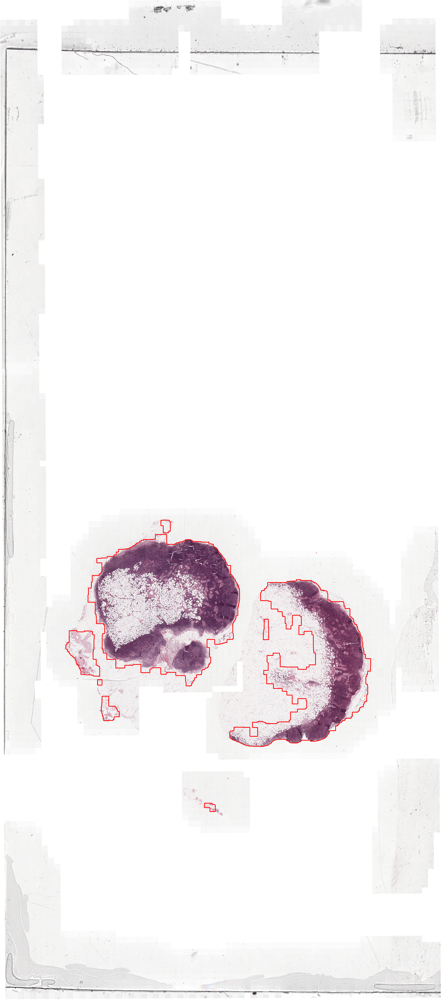

In [20]:
contour_pil

In [10]:
# plt.figure(figsize=(10, 10))
# plt.imshow(slide_image)

In [11]:
# plt.imshow(contour_rgb)

In [ ]:
draw_bbox(bounding_boxes)

In [ ]:
dest_file_path